# Value Based Order Location Anticipation

Prepared by: Hwei Geok Ng (14.04.2022)

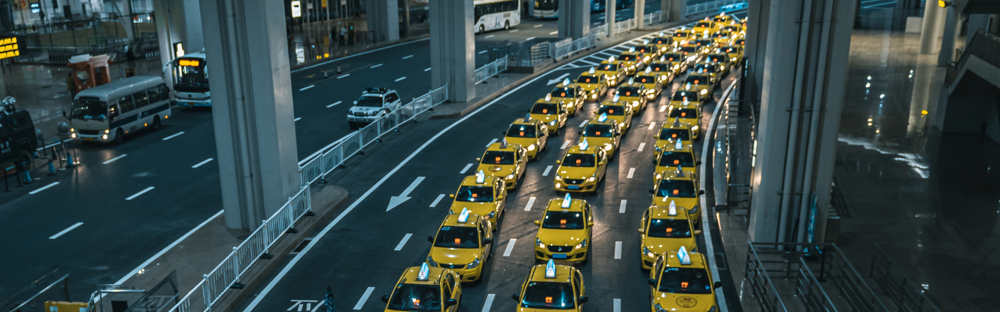

# Background

Availability of supply depends on the duration of time it takes for the drivers to reach the customers.
<br>
In this notebook, we will:
<li> Explore the viability of algorithmic order location anticipation based on the data provided to guide the driver towards areas of highest ride value.
<li> Build a documented simple baseline model.
<li> Describe how I would deploy such a model.
<li> Think through and describe the randomized experiment (AB-test) for live operations.

# Data

The source data is approximately 630000 rows of synthetic ride demand data which resembles the real-life situation in the city of Tallinn:
<br>
<li> start_time - time when the order was made
<li> start_lat - latitude of the location where the order was made
<li> start_lng - longitude of the location where the order was made
<li> end_lat - latitude of the destination point
<li> end_lng - longitude of the destination point
<li> ride_value - how much monetary value is in this particular ride
<br>

# Problem Statement

<li> Based on the given dataset, can we predict locations that will yield the highest ride value, so that drivers can be guided to the locations before time?

# Goal and Metrics

<li> Goal: use the dataset to predict ride values.
<li> Metrics: A regression problem. Use mean squared error loss, and R2 accuracy.
<li> In application: predict ride values of each postcode location on every hour of the day, return top results.

----------------------------------------------------------------------------------------------------------------

# Step 1: Import Libraries

In [1]:
# general
import pickle
import datetime
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set();

# geographical computations
import folium
from geopy.geocoders import Nominatim
from geopy.distance import geodesic

# ML modelling
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV

# Step 2: Load Data

<li> In this step, data is loaded and checked if it contains null values.
<li> Then, the first 10,000 rows is extracted to be used for the rest of the code project to save computation time.

In [2]:
# read csv file

df_data = pd.read_csv('./data/raw/robotex5.csv')

In [3]:
# load first five rows of the dataframe

df_data.head()

,start_time,start_lat,start_lng,end_lat,end_lng,ride_value
0,2022-03-06 15:02:39.329452000,59.407910,24.689836,59.513027,24.831630,3.51825
1,2022-03-10 11:15:55.177526000,59.441650,24.762712,59.426450,24.783076,0.50750
2,2022-03-06 14:23:33.893257000,59.435404,24.749795,59.431901,24.761588,0.19025
3,2022-03-03 09:11:59.104192000,59.406920,24.659006,59.381093,24.641652,0.75600
4,2022-03-06 00:13:01.290346000,59.434940,24.753641,59.489203,24.876170,2.27100


In [4]:
# extract the first 10,000 rows of the dataset

df_data_subset = df_data.copy()[:10000]
print(f"Shape of data subset: {df_data_subset.shape}")

Shape of data subset: (10000, 6)


In [5]:
# check if data has null values

df_data_subset.isna().sum()

start_time    0
start_lat     0
start_lng     0
end_lat       0
end_lng       0
ride_value    0
dtype: int64

In [6]:
# check data characteristics

df_data_subset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   start_time  10000 non-null  object 
 1   start_lat   10000 non-null  float64
 2   start_lng   10000 non-null  float64
 3   end_lat     10000 non-null  float64
 4   end_lng     10000 non-null  float64
 5   ride_value  10000 non-null  float64
dtypes: float64(5), object(1)
memory usage: 468.9+ KB


In [7]:
# check data statistics

df_data_subset.describe()

,start_lat,start_lng,end_lat,end_lng,ride_value
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,59.428859,24.743720,59.413902,24.737914,1.650586
std,0.021523,0.056267,0.850457,0.440644,24.344432
min,59.332558,24.514795,-0.000183,-0.842735,0.116145
25%,59.419130,24.713745,59.416015,24.708762,0.534188
50%,59.432290,24.744660,59.430784,24.744317,1.043375
75%,59.438801,24.768208,59.439277,24.773867,1.705188
max,59.550921,24.958383,60.232926,27.404110,1685.040250


Note:
<br>
<li> The data subset has no missing values.
<li> The column "ride_value" seems to have a large range of values.

# Step 3: Clean Data

<li> In this step, the column "start time" is processed into separate columns of date, time, hour, minute, and second.
<li> This is done to hopefully make the modelling process converge better.

In [8]:
# convert to variable type datetime
converted_datetime = pd.to_datetime(df_data_subset['start_time'])

# omit the milliseconds
converted_datetime = converted_datetime.dt.strftime('%Y-%m-%d %H:%M:%S')

# using the method strftime converts the output as string. Convert it back as type datetime.
converted_datetime = pd.to_datetime(converted_datetime)

In [9]:
# check date range

date_range = converted_datetime.max() - converted_datetime.min()
print(f"Date range = {date_range}.")

Date range = 27 days 23:49:18.


In [10]:
# append date and time separately to the main dataframe

df_data_subset['start_date'] = converted_datetime.dt.date
df_data_subset['start_time'] = converted_datetime.dt.time
df_data_subset['start_time_hour'] = converted_datetime.dt.hour
df_data_subset['start_time_minute'] = converted_datetime.dt.minute
df_data_subset['start_time_second'] = converted_datetime.dt.second

In [11]:
# check dataframe

df_data_subset.head()

,start_time,start_lat,start_lng,end_lat,end_lng,ride_value,start_date,start_time_hour,start_time_minute,start_time_second
0,15:02:39,59.407910,24.689836,59.513027,24.831630,3.51825,2022-03-06,15,2,39
1,11:15:55,59.441650,24.762712,59.426450,24.783076,0.50750,2022-03-10,11,15,55
2,14:23:33,59.435404,24.749795,59.431901,24.761588,0.19025,2022-03-06,14,23,33
3,09:11:59,59.406920,24.659006,59.381093,24.641652,0.75600,2022-03-03,9,11,59
4,00:13:01,59.434940,24.753641,59.489203,24.876170,2.27100,2022-03-06,0,13,1


# Step 4: Feature Engineering

<li> A few features are added to the dataset, which can be contextually helpful. They are: day_of_week, is_weekend, start_postcode, and ride_distance.
<li> day_of_week: which day it is at the value of column "start_date". 1 = monday, 7 = sunday, and so on.
<li> is_weekend: whether the value of column "start_date" falls on a weekend. 0 = not a weekend, 1 = is a weekend.
<li> start_postcode: get postcode of the pickup location based on values of columns "start_lat" and "start_lng". 
<li> Postcodes might be useful when applied in reality. Drivers can check the top ride value areas based on postcodes. Maps can be visualized based on postcodes instead of pinpointing location coordinates. That's why I added this feature.
<li> ride_distance: distance in kilometers between pickup location and destination. End coordinates minus start coordinates.
<li> Rows that have no postcode detected are removed.
<li> Columns "day_of_week" and "start_postcode" are label-encoded to hopefully yield better convergence in regression modelling.
<li> Different versions of preprocessed dataframes, as well as label encoders, are saved along the way.

In [12]:
# add "day_of_week" and "is_weekend" features to the dataframe

day_of_week = []
is_weekend = []

# loop through every row of the column "start_date"
for i in df_data_subset['start_date']:
    
    # by default, the .weekday method returns 0=monday -> 6=sunday. 
    # +1 to make more sense. 1=monday -> 7=sunday.
    day = i.weekday()+1  
    day_of_week.append(day) 
    
    # if day falls on either saturday or sunday, make value = 1, else value = 0.
    weekend = 1 if day == 6 or day == 7 else 0 
    is_weekend.append(weekend)

# append features to the dataframe
df_data_subset['day_of_week'] = day_of_week
df_data_subset['is_weekend'] = is_weekend

In [13]:
# check dataframe

df_data_subset.head()

,start_time,start_lat,start_lng,end_lat,end_lng,ride_value,start_date,start_time_hour,start_time_minute,start_time_second,day_of_week,is_weekend
0,15:02:39,59.407910,24.689836,59.513027,24.831630,3.51825,2022-03-06,15,2,39,7,1
1,11:15:55,59.441650,24.762712,59.426450,24.783076,0.50750,2022-03-10,11,15,55,4,0
2,14:23:33,59.435404,24.749795,59.431901,24.761588,0.19025,2022-03-06,14,23,33,7,1
3,09:11:59,59.406920,24.659006,59.381093,24.641652,0.75600,2022-03-03,9,11,59,4,0
4,00:13:01,59.434940,24.753641,59.489203,24.876170,2.27100,2022-03-06,0,13,1,7,1


In [14]:
# check value range of the column "ride_value"

ride_value_range = df_data_subset['ride_value'].max() - df_data_subset['ride_value'].min()
print(f"Ride value range = {ride_value_range}")

Ride value range = 1684.9241046104419


<AxesSubplot:xlabel='day_of_week', ylabel='ride_value'>

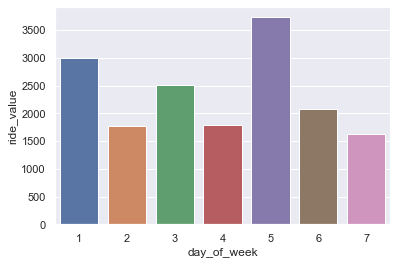

In [15]:
# check the difference in ride value throughout day_of_week

# aggregate data for visualization (x-axis = day_of_week, y-axis = ride_value)
# reset_index to make 'day_of_week' a column instead of index
agg_ride_value = pd.DataFrame(df_data_subset.groupby('day_of_week')['ride_value'].sum()).reset_index()  

sns.barplot(x="day_of_week", y="ride_value", data=agg_ride_value)

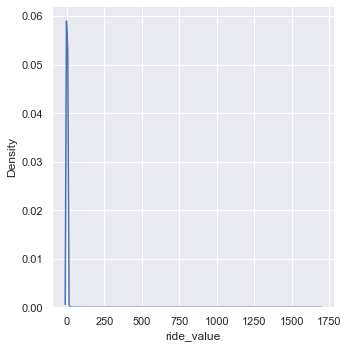

In [16]:
# check the distribution of values in column "ride_value"

sns.displot(df_data_subset, x="ride_value", kind="kde")

Note: 
<br>
<li> The lowest ride value is on Sundays. 
<li> The highest ride value is on Fridays.
<li> The ride value distribution is heavily skewed. Most rides pay much less than $250.
<li> The visualization is subject to only the subset, not the whole dataset.

In [17]:
# map the start coordinates (latitude and longutude) on a map

# pin the map with the center point of the start coordinates
map_talinn = folium.Map(location=[df_data_subset['start_lat'].mean(), df_data_subset['start_lng'].mean()], zoom_start=12)

# add marker to depict start coordinates (subset only)
df_data_subset.apply(lambda row: folium.CircleMarker(location=[row["start_lat"], row["start_lng"]], radius=10)
                    .add_to(map_talinn), axis=1)

# display map
map_talinn

In [18]:
# get postcode based on start latitude and longitude
# get distance travelled based on start and destination latitude and longitude

postcodes = []
ride_distance = []

# initialize the geolocator
geolocator = Nominatim(user_agent="app_name")

# loop through every row of the dataset
for index, row in df_data_subset.iterrows():
    
    # get postcode based on start_lat and start_lng 
    # set timeout to 10 for not getting timeout error
    row_location = geolocator.reverse(f"{row['start_lat']}, {row['start_lng']}", timeout=10)
    
    # add a checking criteria to avoid exception when postcode does not exist
    # if postcode exists, append value. Otherwise, append dummy value "00000"
    postcode = row_location.raw['address']['postcode'] if 'postcode' in row_location.raw['address'] else '00000'
    postcodes.append(postcode)
    
    # get ride distance in kilometers (destination coordinates minus pickup coordinates)
    start_loc = [row['start_lat'], row['start_lng']]
    end_loc = [row['end_lat'], row['end_lng']]
    distance_km = geodesic(start_loc, end_loc).km
    ride_distance.append(distance_km)

# append postcodes and ride_distance to df_data
df_data_subset['start_postcode'] = postcodes
df_data_subset['ride_distance'] = ride_distance

In [19]:
# check dataframe

df_data_subset.head()

,start_time,start_lat,start_lng,end_lat,end_lng,ride_value,start_date,start_time_hour,start_time_minute,start_time_second,day_of_week,is_weekend,start_postcode,ride_distance
0,15:02:39,59.407910,24.689836,59.513027,24.831630,3.51825,2022-03-06,15,2,39,7,1,12913,14.205080
1,11:15:55,59.441650,24.762712,59.426450,24.783076,0.50750,2022-03-10,11,15,55,4,0,10151,2.050095
2,14:23:33,59.435404,24.749795,59.431901,24.761588,0.19025,2022-03-06,14,23,33,7,1,10148,0.774715
3,09:11:59,59.406920,24.659006,59.381093,24.641652,0.75600,2022-03-03,9,11,59,4,0,12615,3.041401
4,00:13:01,59.434940,24.753641,59.489203,24.876170,2.27100,2022-03-06,0,13,1,7,1,10143,9.209442


In [20]:
# check unique values of column "start_postcode"

df_data_subset['start_postcode'].nunique()

291

In [21]:
# check number of rows where there is no postcode

df_data_subset[df_data_subset['start_postcode'] == '00000'].shape

(6, 14)

In [22]:
# remove the rows that has no postcode

df_data_subset_filtered = df_data_subset[df_data_subset['start_postcode'] != '00000']
df_data_subset_filtered.shape

(9994, 14)

In [23]:
# label encode categorical variables

# day_of_week
day_of_week_encoder = preprocessing.LabelEncoder()
day_of_week_encoded = day_of_week_encoder.fit_transform(df_data_subset_filtered['day_of_week'])

# postcode
postcode_encoder = preprocessing.LabelEncoder()
postcode_encoded = postcode_encoder.fit_transform(df_data_subset_filtered['start_postcode'])

In [24]:
# display day_of_week encoded classes

day_of_week_encoder.classes_

array([1, 2, 3, 4, 5, 6, 7], dtype=int64)

In [25]:
# display postcode encoded classes

postcode_encoder.classes_

array(['10001', '10111', '10112', '10113', '10114', '10115', '10116',
       '10117', '10118', '10119', '10120', '10121', '10122', '10123',
       '10124', '10125', '10126', '10127', '10128', '10129', '10130',
       '10131', '10132', '10133', '10134', '10135', '10136', '10137',
       '10138', '10139', '10140', '10141', '10142', '10143', '10144',
       '10145', '10146', '10147', '10148', '10149', '10150', '10151',
       '10152', '10154', '10155', '10159', '10311', '10312', '10313',
       '10314', '10315', '10316', '10317', '10318', '10319', '10320',
       '10321', '10323', '104012', '10402', '10411', '10412', '10413',
       '10414', '10415', '10416', '10611', '10612', '10613', '10614',
       '10615', '10616', '10617', '10618', '10619', '10620', '10621',
       '10911', '10912', '10913', '10914', '10915', '10916', '10917',
       '10918', '10919', '10920', '10921', '10922', '11101', '11211',
       '11212', '11213', '11214', '11215', '11216', '11217', '11218',
       '11311', '11

In [26]:
# append encoded values to df_data_subset_filtered

df_data_preprocessed = df_data_subset_filtered.copy()
df_data_preprocessed['day_of_week_encoded'] = day_of_week_encoded
df_data_preprocessed['start_postcode_encoded'] = postcode_encoded

In [27]:
# check dataframe

df_data_preprocessed.head()

,start_time,start_lat,start_lng,end_lat,end_lng,ride_value,start_date,start_time_hour,start_time_minute,start_time_second,day_of_week,is_weekend,start_postcode,ride_distance,day_of_week_encoded,start_postcode_encoded
0,15:02:39,59.407910,24.689836,59.513027,24.831630,3.51825,2022-03-06,15,2,39,7,1,12913,14.205080,6,155
1,11:15:55,59.441650,24.762712,59.426450,24.783076,0.50750,2022-03-10,11,15,55,4,0,10151,2.050095,3,41
2,14:23:33,59.435404,24.749795,59.431901,24.761588,0.19025,2022-03-06,14,23,33,7,1,10148,0.774715,6,38
3,09:11:59,59.406920,24.659006,59.381093,24.641652,0.75600,2022-03-03,9,11,59,4,0,12615,3.041401,3,148
4,00:13:01,59.434940,24.753641,59.489203,24.876170,2.27100,2022-03-06,0,13,1,7,1,10143,9.209442,6,33


In [28]:
# save preprocessed datasets as CSV files

df_data_subset.to_csv('./data/preprocessed/robotex5_subset.csv', index=False)
df_data_subset_filtered.to_csv('./data/preprocessed/robotex5_subset_filtered.csv', index=False)
df_data_preprocessed.to_csv('./data/preprocessed/robotex5_subset_filtered_preprocessed.csv', index=False)

In [29]:
# save encoders as pickle files

with open('./data/preprocessed/encoder_day_of_week.pickle', 'wb') as handle:
    pickle.dump(day_of_week_encoder, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
with open('./data/preprocessed/encoder_postcode.pickle', 'wb') as handle:
    pickle.dump(postcode_encoder, handle, protocol=pickle.HIGHEST_PROTOCOL)

# Step 5: ML Modelling and Evaluation

<li> In this step, final features are selected for the use of ML modelling.
<li> The selected columns for Inputs are: start_lat, start_lng, start_postcode_encoded, start_time_hour, start_time_minute, start_time_second, end_lat, end_lng, day_of_week_encoded, is_weekend, and ride_distance.
<li> The selected column for Ground Truth is: ride_value.
<li> Train-test-split is performed with 80% train set and 20% test set. Validation set is not explicitly generated, as it will be done in cross-validation.
<li> Three models are applied to the dataset in their default parameters for 5-fold cross-validation.
<li> The three models are: linear regression, random forest regressor, and gradient boosting regressor.
<li> The model with best score is further evaluated with test set.
<li> Plots of y_test and y_pred are presented to see comparison.

In [30]:
# extract columns to be used as input and output variables

# input variables
df_X = df_data_preprocessed[['start_lat', 'start_lng', 'start_postcode_encoded', 'start_time_hour', 'start_time_minute', 'start_time_second', 'end_lat', 'end_lng', 'day_of_week_encoded', 'is_weekend', 'ride_distance']]

# output variable
df_y = df_data_preprocessed['ride_value']

In [31]:
# check input variables

df_X.head()

,start_lat,start_lng,start_postcode_encoded,start_time_hour,start_time_minute,start_time_second,end_lat,end_lng,day_of_week_encoded,is_weekend,ride_distance
0,59.407910,24.689836,155,15,2,39,59.513027,24.831630,6,1,14.205080
1,59.441650,24.762712,41,11,15,55,59.426450,24.783076,3,0,2.050095
2,59.435404,24.749795,38,14,23,33,59.431901,24.761588,6,1,0.774715
3,59.406920,24.659006,148,9,11,59,59.381093,24.641652,3,0,3.041401
4,59.434940,24.753641,33,0,13,1,59.489203,24.876170,6,1,9.209442


In [32]:
# check output variable

df_y.head()

0    3.51825
1    0.50750
2    0.19025
3    0.75600
4    2.27100
Name: ride_value, dtype: float64

In [33]:
# make test set 20% of the dataset
test_size = 0.2

# split dataset into train and test sets (each with corresponding input and output variables)
X_train, X_test, y_train, y_test = train_test_split(df_X, df_y, test_size=test_size, random_state=42)

In [34]:
# check the data dimension of train set input

X_train.shape

(7995, 11)

In [35]:
# check the data dimension of test set input

X_test.shape

(1999, 11)

In [36]:
# check the data dimension of train set output

y_train.shape

(7995,)

In [37]:
# check the data dimension of test set output

y_test.shape

(1999,)

In [38]:
# model selection with 5-fold cross-validation

# define models and their names
estimators = [LinearRegression(), RandomForestRegressor(), GradientBoostingRegressor()]
estimator_names = ['Linear Regression', 'Random Forest Regressor', 'Gradient Boosting Regressor']

# set 5-fold cross validation
folds = KFold(n_splits=5, shuffle=True, random_state=42)
overall_scores = []

# loop through each model
for i in range(len(estimators)):
    
    # define a pipeline with two steps: 1. scale the range of all values to 0-1
    # 2. train with selected model
    pipe = Pipeline([('scaler', MinMaxScaler()),
                     ('estimator', estimators[i])])
    
    # execute cross-validation with the pipeline
    # use negative mean squared error as its measuring score
    scores = cross_val_score(pipe, X_train, y_train, scoring='neg_mean_squared_error', cv=folds)
    
    # get the model name
    model_name = estimator_names[i]
    
    # use absolute value of the mean cross-validation score to get a mean squared error value
    mean_MSE_score = abs(scores.mean())
    
    # append score and print result
    overall_scores.append(mean_MSE_score)
    print(f"The mean cross validation score (MSE) for model {model_name} is {mean_MSE_score}")

# display the best model and its scores 
best_score = min(overall_scores)
best_score_index = overall_scores.index(best_score)
best_model = estimator_names[best_score_index]
print(f"The best model is {best_model} with score: {best_score}")

The mean cross validation score (MSE) for model Linear Regression is 0.15427835861669092
The mean cross validation score (MSE) for model Random Forest Regressor is 106.38380902035162
The mean cross validation score (MSE) for model Gradient Boosting Regressor is 1.4663053342447205
The best model is Linear Regression with score: 0.15427835861669092


In [39]:
# evaluation with test set based on best model

# scale train and test set inputs to range 0-1
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# train with the best model: linear regression
linear_regression = LinearRegression()
linear_regression.fit(X_train_scaled, y_train)

# evaluate with test set using the trained model
y_pred = linear_regression.predict(X_test_scaled)

# calculate mean squared error and r2 accuracy score
loss_score = mean_squared_error(y_test, y_pred)
accuracy_score = r2_score(y_test, y_pred)
print(f"Linear regression on Test Set: loss score = {loss_score}, accuracy score = {accuracy_score}")

Linear regression on Test Set: loss score = 0.007351062718413611, accuracy score = 0.9956670451983676


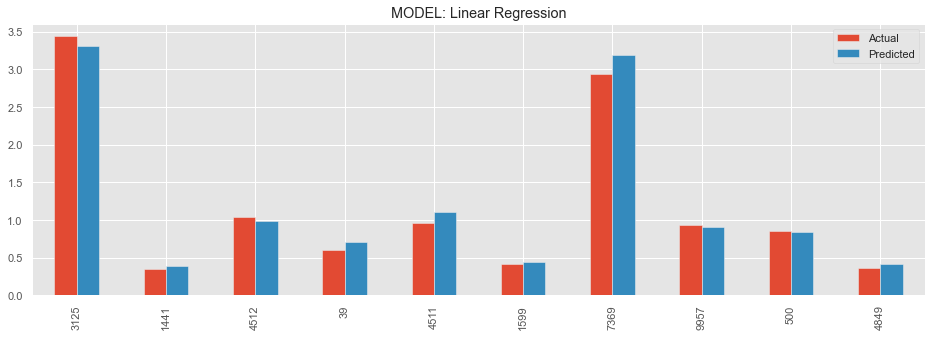

In [40]:
# plot y_test vs y_pred (first 10 ride_values)

plt.style.use('ggplot')
reg_real_vs_pred = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
reg_real_vs_pred = reg_real_vs_pred.head(10)
reg_real_vs_pred.plot(kind='bar', title='MODEL: Linear Regression', figsize=(16,5))
plt.show()

C:\Users\nghwe\AppData\Roaming\Python\Python38\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Linear Regression: Actual vs Predicted')

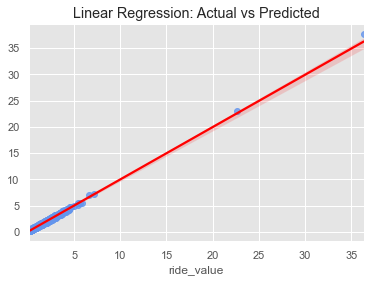

In [41]:
# plot y_test vs y_pred

sns.regplot(y_test, y_pred, 
            scatter_kws={"color":"cornflowerblue"}, 
            line_kws={"color":"red"}).set_title('Linear Regression: Actual vs Predicted')

In [42]:
# save trained model as pickle

with open('./data/preprocessed/linear_regression_model.pickle', 'wb') as handle:
    pickle.dump(linear_regression, handle, protocol=pickle.HIGHEST_PROTOCOL)

----------------------------------------------------------------------------------------------------------------

# Answering The Problem Statement

<b>Statement</b>
<ul>
    <li> Based on the given dataset, can we predict locations that will yield the highest ride value, so that drivers can be guided to the locations before time?
</ul>
<b>Answer</b>
<ul>
    <li>Based on the baseline model, we can predict ride value for each location, which the ride values can be ranked to return the top locations that will potentially yield the highest ride value. Drivers can then be informed and guided to these locations before the time.
</ul>
<b>Potential for optimization</b>
<ul>
    <li>Data: consider including weather dataset, datetime and address of local events and holidays, airline schedules. Use full dataset instead of a subset.
    <li>Models: consider optimizing models with hyperparameter optimization.
    <li>Methodologies: consider implementing spatio-temporal forecasting models [1][2]. 
</ul>
[1] https://www.sciencedirect.com/science/article/abs/pii/S0968090X20305805
<br>
[2] https://link.springer.com/article/10.1007/s42421-021-00041-4

# Model Deployment

<b>Server</b> 
<ul>
    <li> Model training and optimization are carried out at the server side. Example: AWS EC2.
    <li> New models can be automatically deployed in the server using the CI/CD pipeline.
</ul>
<b>Notebooks</b> 
<ul>
    <li> Jupyter Notebooks are used to do data analysis and modelling. Example: AWS Sagemaker.
    <li> The trained model is optimised and saved in the database. Example: pickle file.
</ul>
<b>Database</b> 
<ul>
    <li> The model and dataset are hosted and archived on a chosen cloud storage. Example: AWS S3.
</ul>
<b>APIs</b> 
<ul>
    <li> On-demand prediction: create a REST API with a "predict" POST request. Example: Flask.
    <li> It receives an input, preprocess the data, uses the model to predict data and returns a series of predicted ride values. 
    <li> Batch prediction: create an automated scheduler that batch predicts input data everyday. Example: Apache AirFlow.
</ul>

<b>Frontend applications: web and/or mobile</b> 
<ul>
    <li> Batch prediction scenario: the web or mobile backend receives a new batch of prediction everyday. For every hour of the day, predict ride value for every postcode. Use backend to sort the ride value and return the top 3 ride value locations for every hour. Drivers can interact with a slider or a map to know which areas have the highest ride value of that day.
    <li> On-demand prediction scenario: drivers input a postcode or location coordinate, as well as a chosen hour of the day. The Enter key sends input to the API and receives a ride value.
</ul>  

# A/B Test Design for Live Operations

<b>User base</b> 
<ul>
    <li> Control group A: customer base using the existing app without functionality of knowing higher ride value locations.
    <li> Test group B: customer base using an updated app with functionality of knowing higher ride value locations.
</ul>

<b>Metrics and hypotheses</b> 
<ul>
    <li> Metrics: <u>hire-ride-ratio</u> / driver idle time / customer wait time / cancel rate / hire completion rate.
    <li> Hypothesis: Test group B will have a higher hire-ride-ratio compared to control group A.
    <li> Null hypothesis: There is no significant difference between the test and control groups.
</ul>

<b>A/B test design</b> 
<ol>
    <li> Select a dedicated sample size for Control group A and Test group B using random sampling.
    <li> Deploy an updated app to a dedicated sample size as Test group B. 
    <li> Measure the hire-ride-ratio for both groups for a set period of time.
    <li> After data is collected, compare the hire-ride-ratio for both groups. Get preliminary results, for example, Test group B has a higher hire-ride-ratio compared to Control group A.
    <li> Check if the result is statistically significant. Use the ttest_ind() function of the Scipy library for T-test calculation.
    <ul>
        <li> The ttest_ind() function returns two values: t-statistics and p-value. 
        <li> T-statistics quantifies the difference between the arithmetic means of the test and control groups.
        <li> A higher t-statistic value means a larger difference between the average standard error between the two groups, which supports our hypothesis.
        <li> P-value quantifies the probability of the null hypothesis to be true.
        <li> A p-value lower than 0.05 will make the null hypothesis invalid. It means that the test and control groups are statistically significant.
    </ul>
    <li> Make a business decision based on the A/B test result.
</ol>